In [1]:
import random
import math
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from scipy import stats
from scipy.interpolate import interp1d
from scipy. special import rel_entr # Kullback-Leibler divergence
import os
import pandas as pd
import pathlib
#from photutils.aperture import EllipticalAperture
import scipy
import scipy.stats as st

In [2]:
cdf_list =  sorted(str(p) for p in pathlib.Path("C:\\Users\\Oleg\\Desktop\\Paris Saclay\\These\\5_MODEL\\DDM_exp_1\\2_separated_v5\\DDM_zfix05\\cdf").glob("*.csv"))
print(len(cdf_list))

112


In [5]:
#cdf_list =  sorted(str(p) for p in pathlib.Path("C:/Users/opolezh/Desktop/Paris Saclay/These/6_Github/4_DDM/DDM/cdf").glob("*.csv"))
#print(len(cdf_list))
# cdf_list

In [5]:
def make_data_list (cdf_list):
    data_init = []
    for elem in cdf_list:
        df = pd.read_csv(elem, skiprows=1,header=None,sep="\t" or " ",  decimal=",")
        df[0] = df[0].str.replace(',', '.').astype(float)
        df[1] = df[1].str.replace(',', '.').astype(float)
        df[2] = df[2].str.replace(',', '.').astype(float)
        df[3] = df[3].str.replace(',', '.').astype(float)
        df = df.fillna(0)
    #     df[3] = df[3].str.replace(',', '.').astype(float)
        data_init.append(df)
    return data_init

In [34]:
data_init[0]

,0,1,2,3
0,-0.839,0.00,-30.00,0.0
1,-0.839,0.01,-29.99,0.0
2,-0.803,0.02,-29.98,0.0
3,-0.795,0.03,-29.97,0.0
4,-0.738,0.04,-29.96,0.0
...,...,...,...,...
5996,0.000,0.00,29.96,1.0
5997,0.000,0.00,29.97,1.0
5998,0.000,0.00,29.98,1.0
5999,0.000,0.00,29.99,1.0


In [7]:
def make_new_cdf (data_init):
    new_cdf_list  = []
    for elem in data_init :
        x_emp = np.array(elem[0],dtype  = float)
        y_emp =np.array(elem[1],dtype  = float)
        x_adj = np.array(elem[2],dtype  = float)
        y_adj =np.array(elem[3],dtype  = float)

        # extraire les parties correspondant aux valeurs positives des x
        ind_emp_pos = np.argwhere(x_emp>0)
        x_emp_pos = x_emp[ind_emp_pos].reshape(len(ind_emp_pos),)
        y_emp_pos = y_emp[ind_emp_pos].reshape(len(ind_emp_pos),)

        ind_adj_pos = np.argwhere(x_adj>0)
        x_adj_pos = x_adj[ind_adj_pos].reshape(len(ind_adj_pos),)
        y_adj_pos = y_adj[ind_adj_pos].reshape(len(ind_adj_pos),)
        f = interp1d(x_adj_pos,y_adj_pos,)
        y_interp_adj = f(x_emp_pos)
        new_cdf =np.concatenate([x_emp_pos.reshape(len(x_emp_pos),1),y_emp_pos.reshape(len(x_emp_pos),1),y_interp_adj.reshape(len(x_emp_pos),1)],axis=1)

        new_cdf_list.append(new_cdf)
    return new_cdf_list

In [8]:
data_init = make_data_list (cdf_list)
new_cdf_list = make_new_cdf (data_init)
len(data_init),len(new_cdf_list)

(112, 112)

In [ ]:

plt.plot(x_emp_rdw_84,y_emp_rdw_84, 'o',)
plt.plot(x_adj_rdw_84,y_adj_rdw_84,'--',)
plt.xlim(-10,10)

In [9]:
cdf_iid_diff = new_cdf_list[0:28]
cdf_iid_same = new_cdf_list[28:56]
cdf_rdw_diff = new_cdf_list[56:84]
cdf_rdw_same =new_cdf_list[84:]



In [20]:
x_emp_rdw_84 = np.array(data_init[84][0],dtype  = float)
y_emp_rdw_84 =np.array(data_init[84][1],dtype  = float)
x_adj_rdw_84 = np.array(data_init[84][2],dtype  = float)
y_adj_rdw_84 =np.array(data_init[84][3],dtype  = float)

cdf_rdw_same_84 = [cdf_rdw_same[0]]

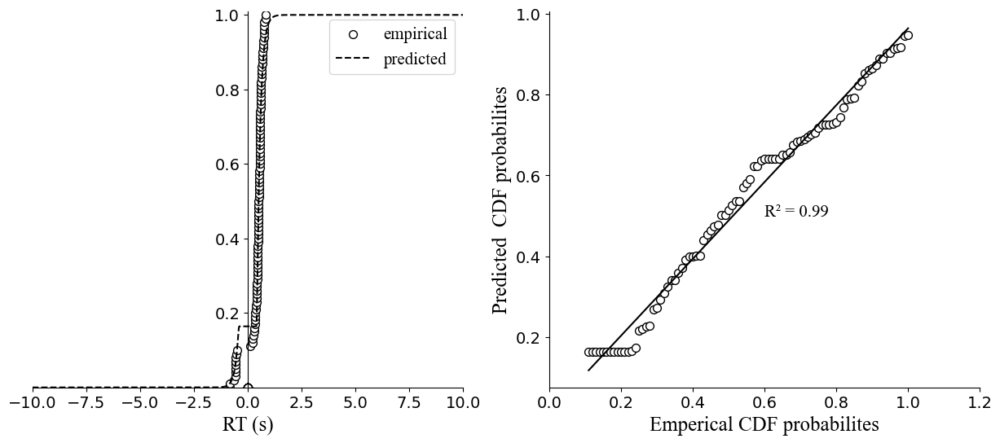

In [63]:
for i in range(len(cdf_rdw_same_84)):   
    #elem = cdf_iid_diff[i]
# for elem in new_cdf_list:   
    fig = plt.figure(figsize=(15, 6))

    
    plt.subplot(1,2,1)

    plt.scatter(x_emp_rdw_84,y_emp_rdw_84, marker='o',color='w',s= 50,edgecolors='black', label ='empirical')
    plt.plot(x_adj_rdw_84,y_adj_rdw_84,'--' , color='k', label ='predicted')
    plt.xlabel('RT (s)',fontsize=18,fontname="Times New Roman")
    #plt.ylabel('RT (s)',fontsize=15,fontname="Times New Roman")
    #plt.title(f'RDW same')  
    plt.gca().spines['left'].set_position('zero')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(prop={'size': 15, 'family': "Times New Roman"})
    plt.xlim(-10,10)
    plt.ylim(0.,1.01)
    plt.ylim(0, 1.01)
    plt.yticks(np.arange(0, 1.1, 0.2))
    plt.tick_params(axis='both', which='major', labelsize=14)
    y_ticks = plt.gca().get_yticks()
    y_ticks = y_ticks[y_ticks != 0]
    plt.gca().set_yticks(y_ticks)
    # Устанавливаем точку пересечения осей в нуле для оси X
    plt.gca().spines['left'].set_position(('data', 0))
    
    plt.subplot(1,2,2)
    elem = cdf_rdw_same_84[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2

    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=18,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=18,fontname="Times New Roman")
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    #plt.title(f'RDW same')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")
    plt.tick_params(axis='both', which='major', labelsize=14)

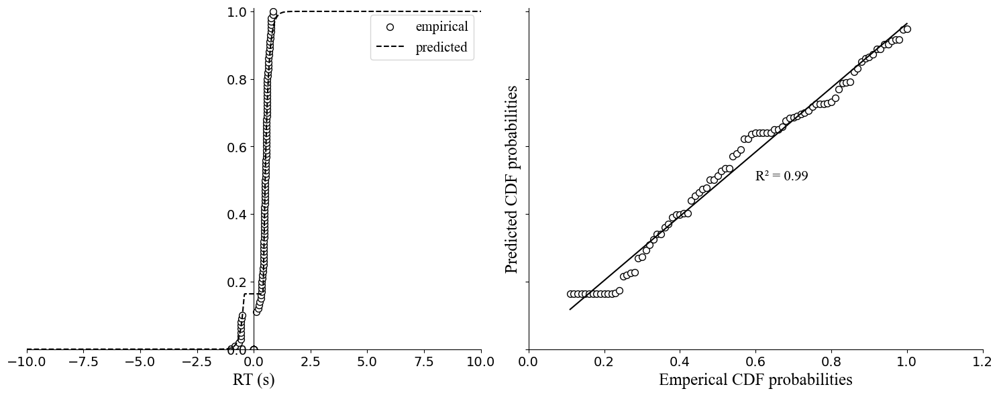

In [60]:
import numpy as np
import scipy.stats
import matplotlib.pyplot as plt

for i in range(len(cdf_rdw_same_84)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharey=True)

    ax1.scatter(x_emp_rdw_84, y_emp_rdw_84, marker='o', color='w', s=50, edgecolors='black', label='empirical')
    ax1.plot(x_adj_rdw_84, y_adj_rdw_84, '--', color='k', label='predicted')
    ax1.set_xlabel('RT (s)', fontsize=18, fontname="Times New Roman")
    ax1.spines['left'].set_position('zero')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.legend(prop={'size': 15, 'family': "Times New Roman"})
    ax1.set_xlim(-10, 10)
    ax1.set_ylim(0., 1.01)
    ax1.tick_params(axis='both', which='major', labelsize=14)

    elem = cdf_rdw_same_84[i]
    Y_test = elem[:, 1]
    Y_pred = elem[:, 2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(Y_test, Y_pred)
    r_squared = r_value ** 2

    ax2.scatter(Y_test, Y_pred, marker='o', color='w', s=50, edgecolors='black')
    ax2.set_xlabel('Emperical CDF probabilities', fontsize=18, fontname="Times New Roman")
    ax2.set_ylabel('Predicted CDF probabilities', fontsize=18, fontname="Times New Roman")
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)), 'k')
    ax2.set_xlim(0, 1.2)
    ax2.text(0.6, 0.5, 'R² = %0.2f' % r_squared, fontsize=15, fontname="Times New Roman")
    ax2.tick_params(axis='both', which='major', labelsize=14)

    plt.tight_layout()
    plt.show()


In [10]:
len(cdf_iid_diff), len(cdf_iid_same),len(cdf_rdw_diff),len(cdf_rdw_same)

(28, 28, 28, 28)

C:\Users\Oleg\AppData\Local\Temp\ipykernel_16428\77953711.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 8))


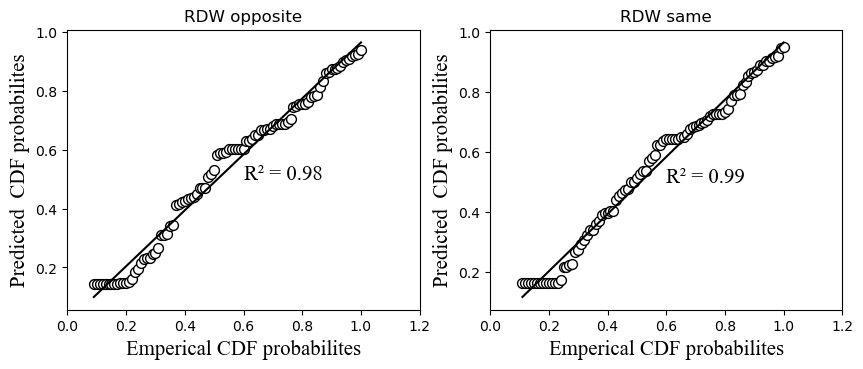

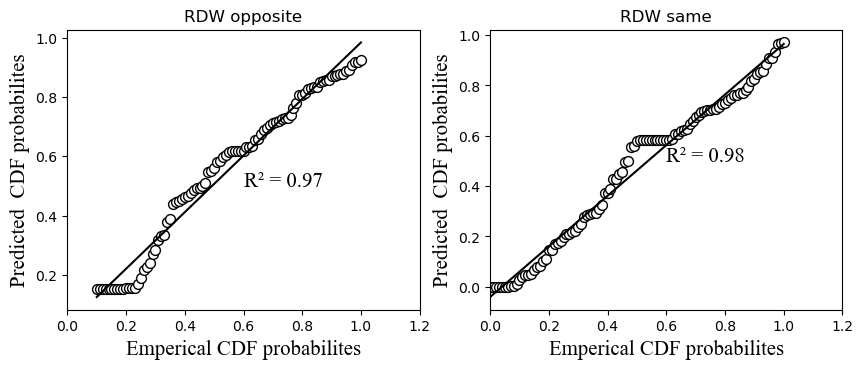

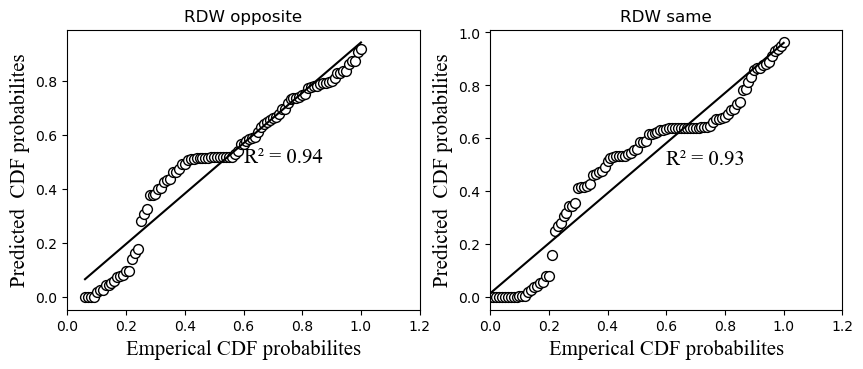

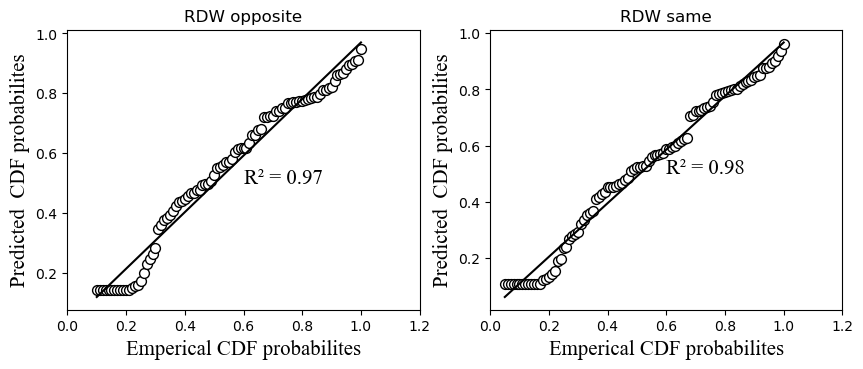

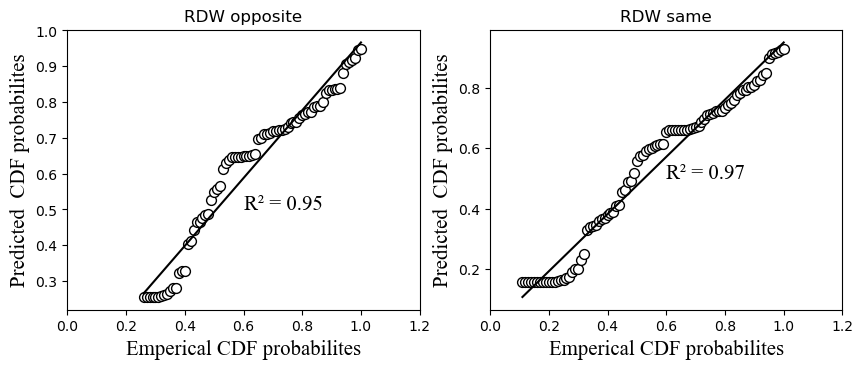

...

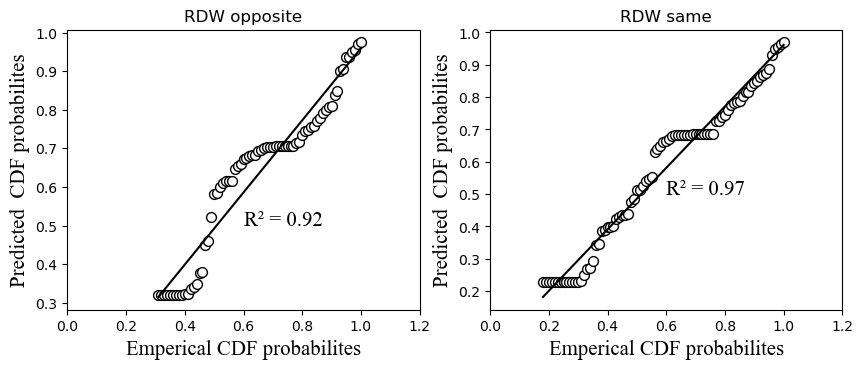

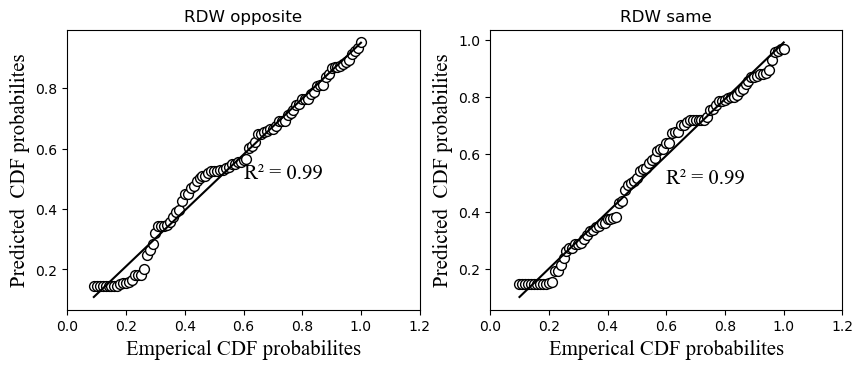

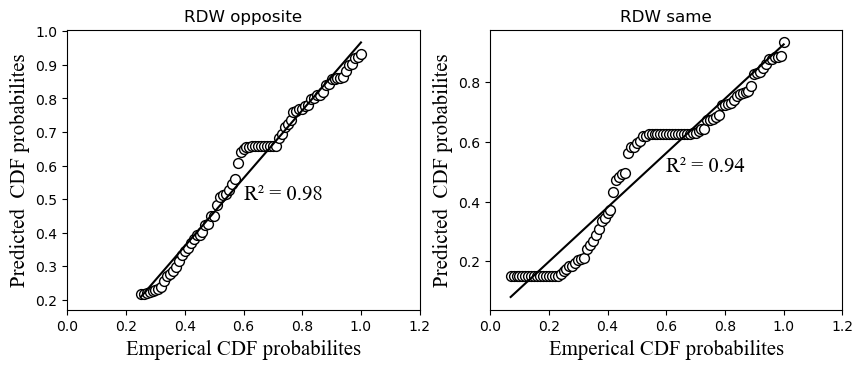

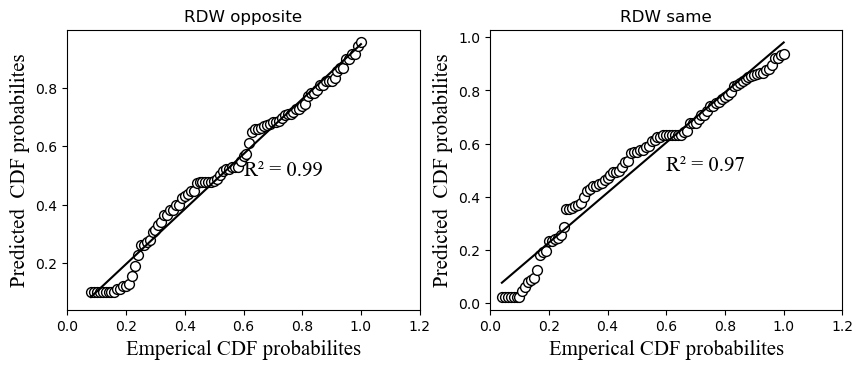

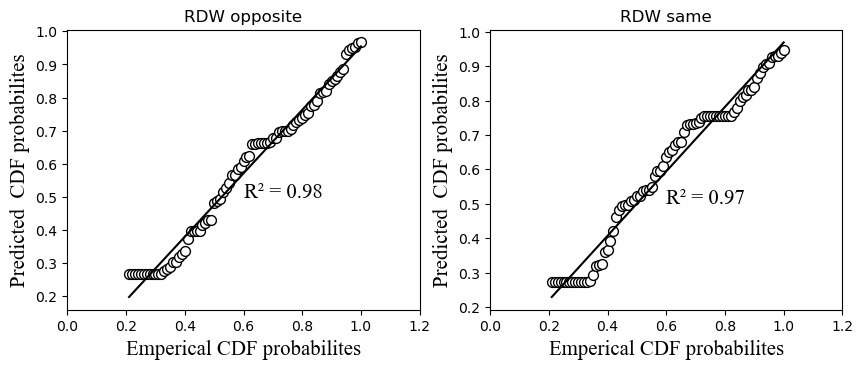

In [8]:
slope_list = []
p_value_list = []
intercept_list = []
r_list = []
for i in range(len(cdf_iid_diff)):   
    elem = cdf_iid_diff[i]
# for elem in new_cdf_list:   
    fig = plt.figure(figsize=(10, 8))

    
    plt.subplot(2,2,3)
    elem = cdf_rdw_diff[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'RDW opposite')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")
    
    plt.subplot(2,2,4)
    elem = cdf_rdw_same[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'RDW same')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")

C:\Users\Oleg\AppData\Local\Temp\ipykernel_16428\1432355566.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10, 8))


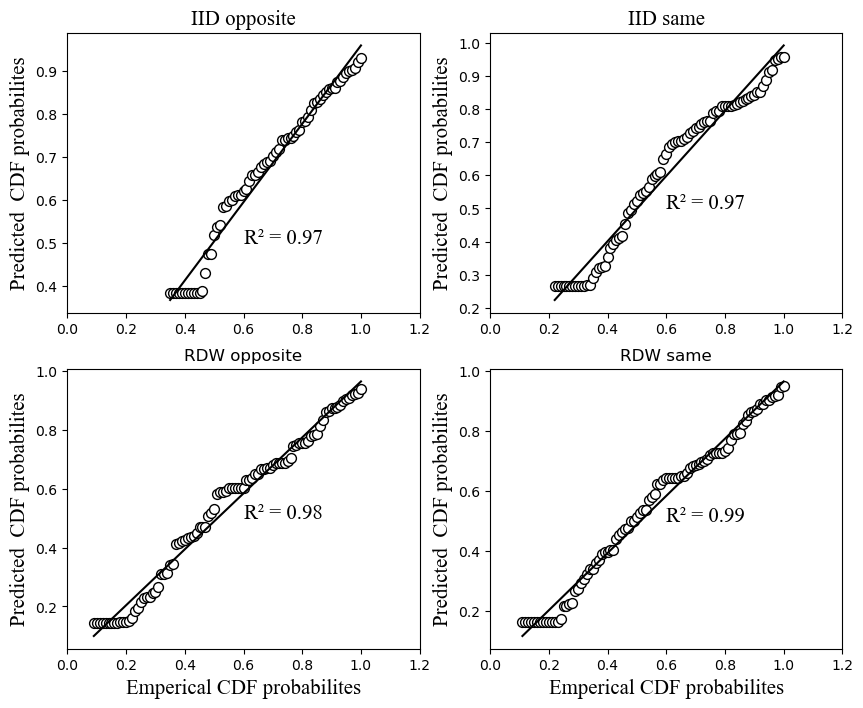

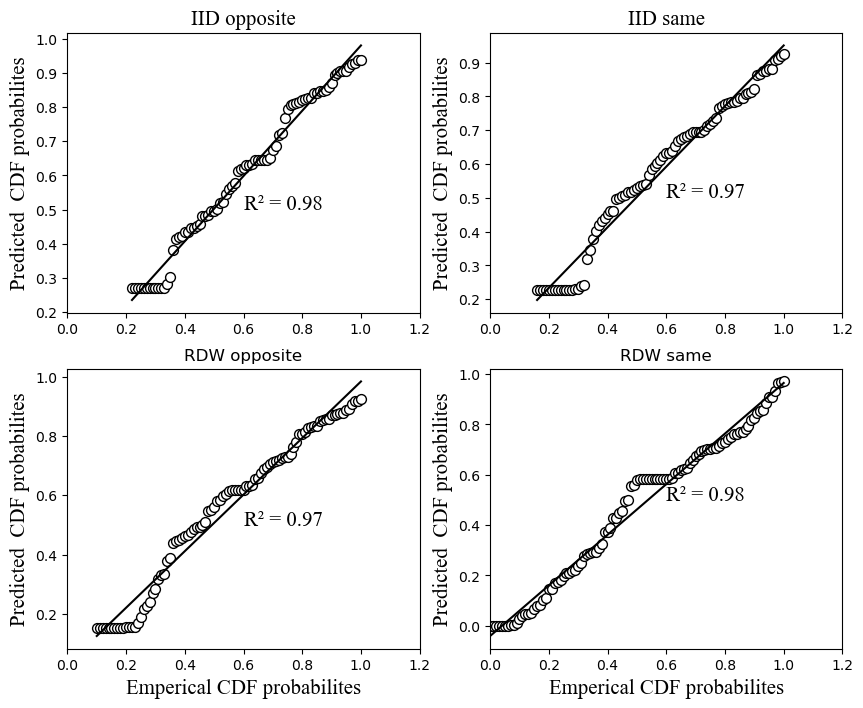

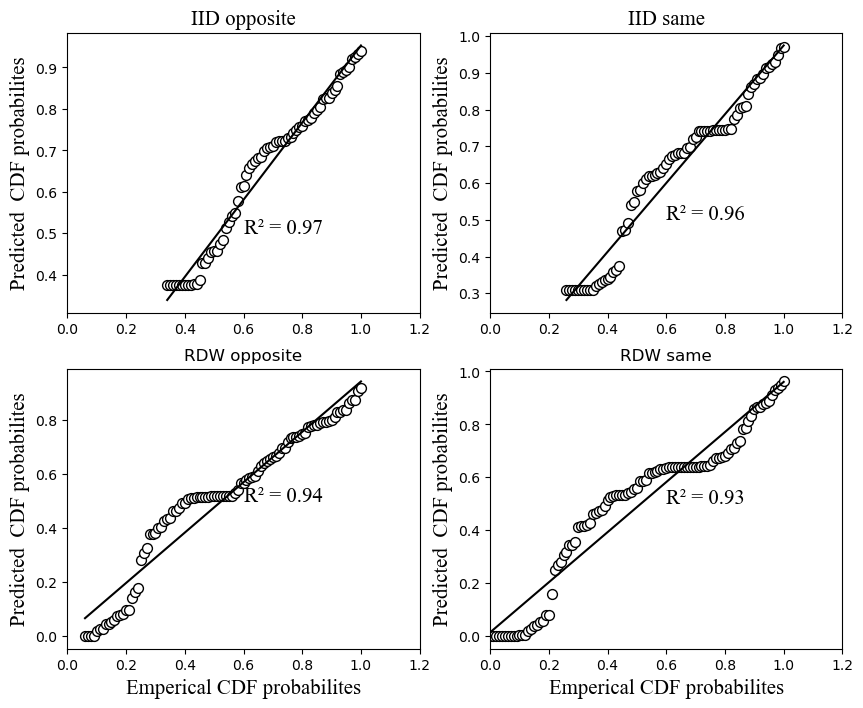

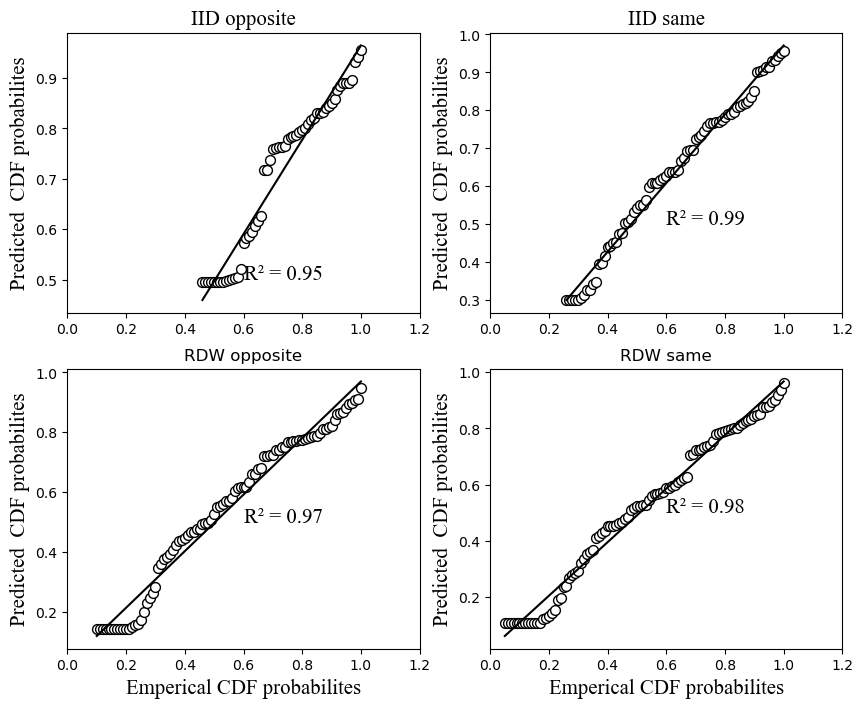

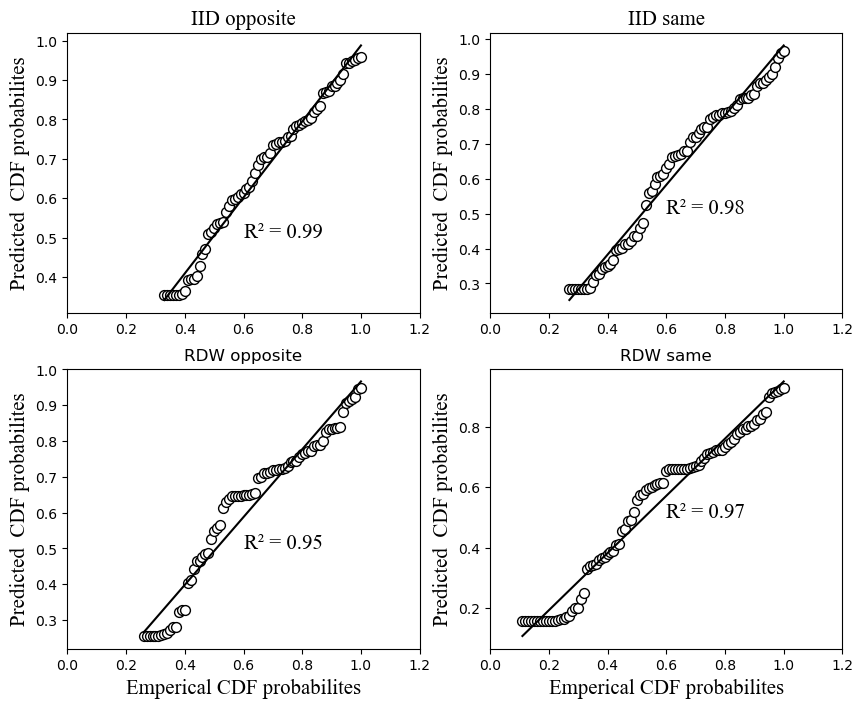

...

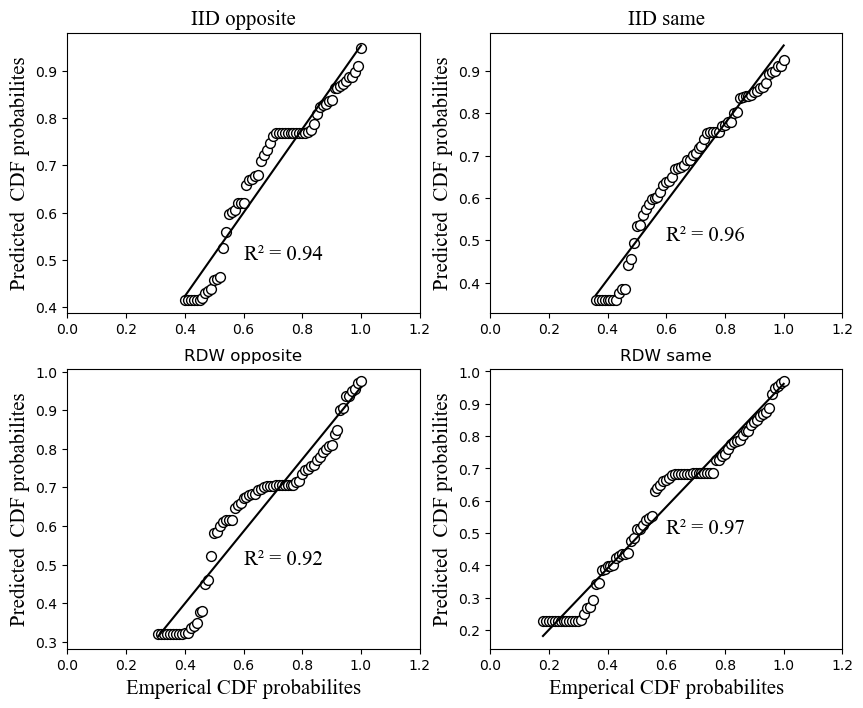

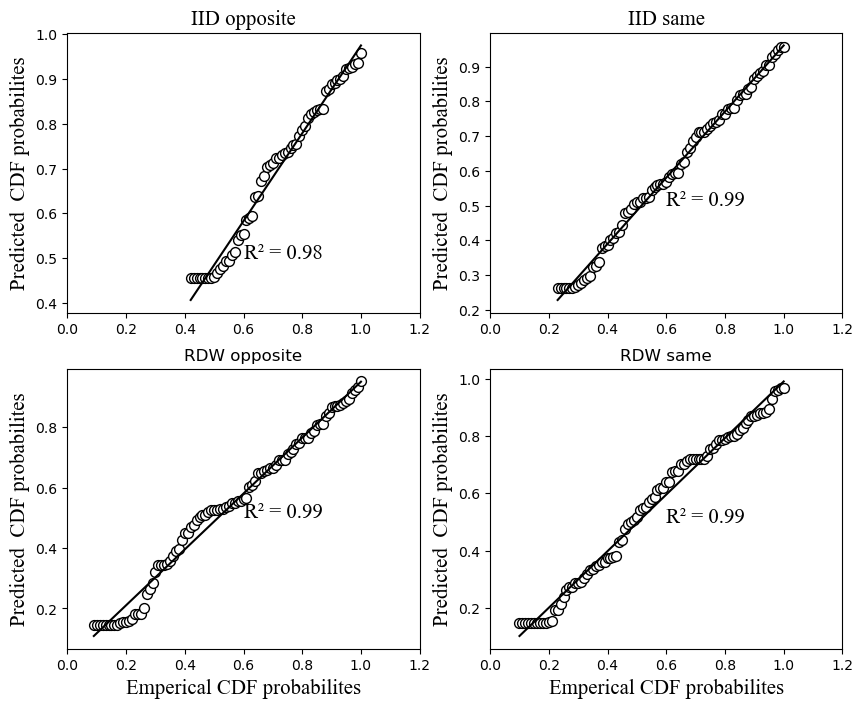

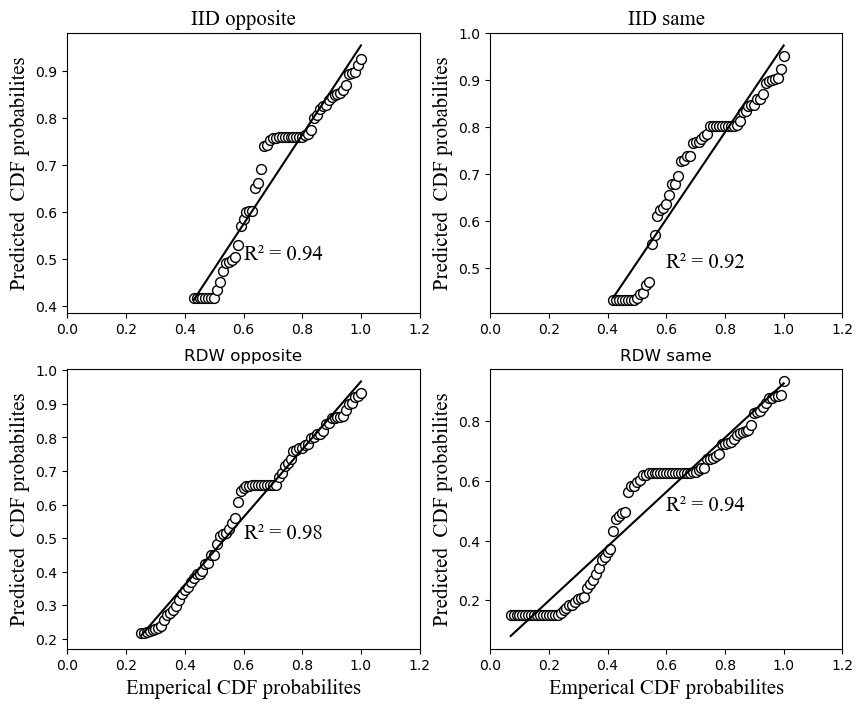

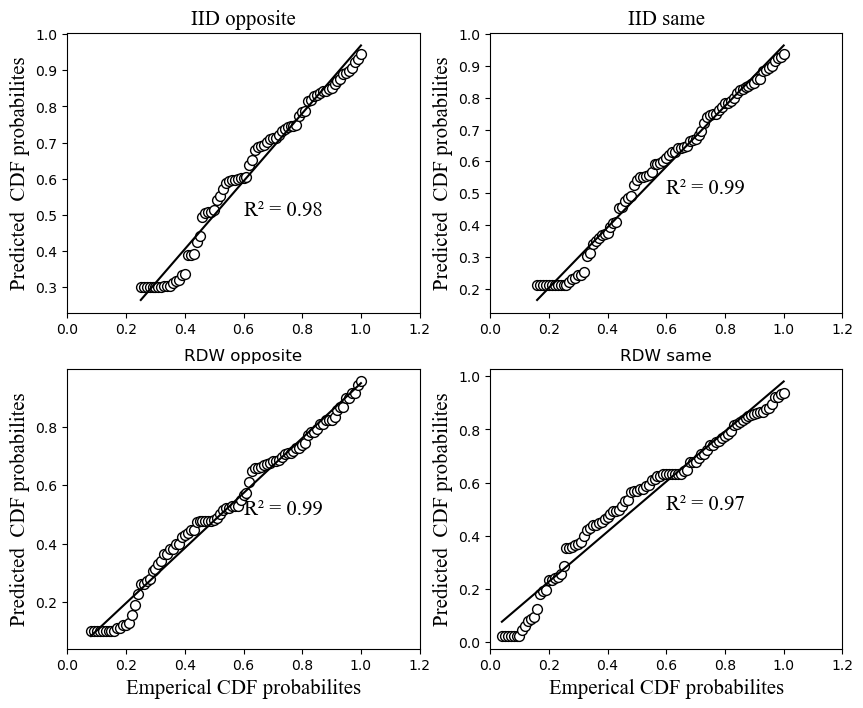

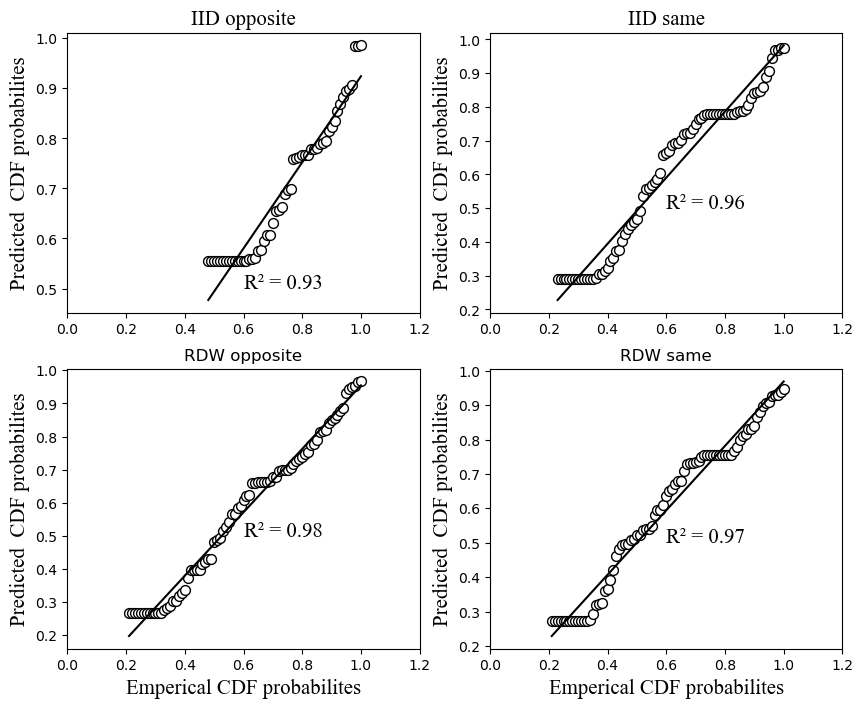

In [7]:
slope_list = []
p_value_list = []
intercept_list = []
r_list = []
for i in range(len(cdf_iid_diff)):   
    elem = cdf_iid_diff[i]
# for elem in new_cdf_list:   
    fig = plt.figure(figsize=(10, 8))
    plt.subplot(2,2,1)
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
#     plt.xlabel('Emperical CDF probabilites')
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'IID opposite',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")
    
    plt.subplot(2,2,2)
    elem = cdf_iid_same[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
#     plt.xlabel('Emperical CDF probabilites')
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'IID same',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")
    
    plt.subplot(2,2,3)
    elem = cdf_rdw_diff[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'RDW opposite')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")
    
    plt.subplot(2,2,4)
    elem = cdf_rdw_same[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'RDW same')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'R² = %0.2f' % r_squared,fontsize=15,fontname="Times New Roman")

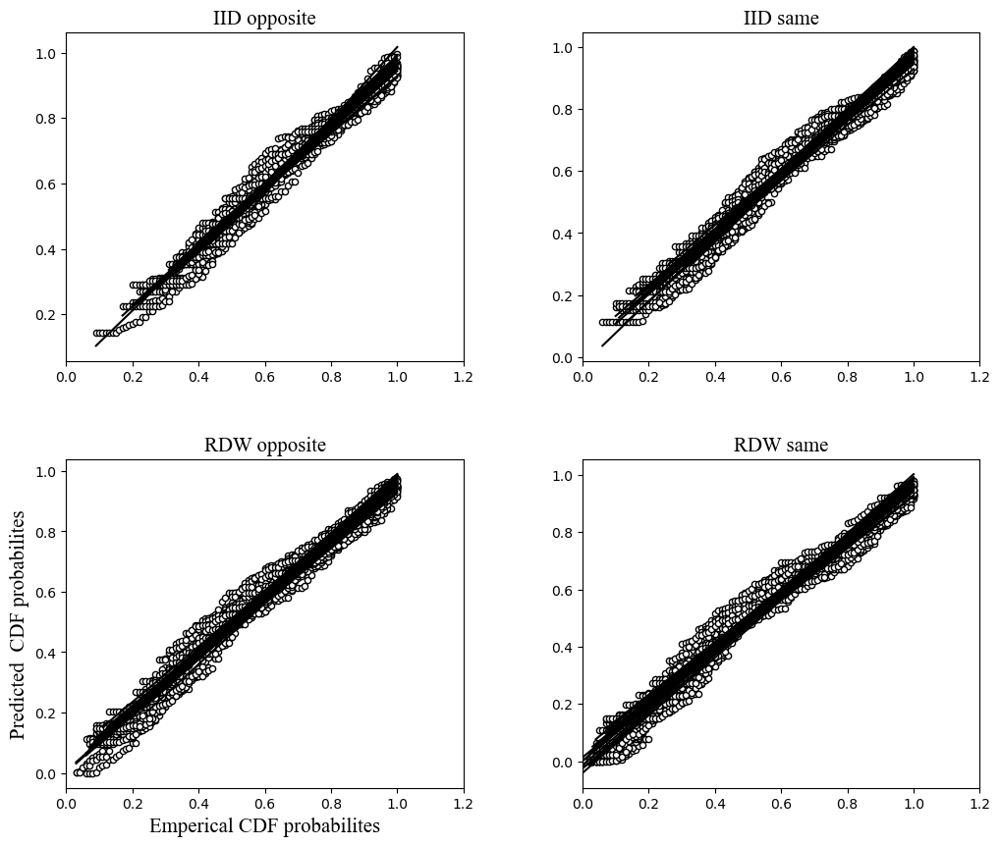

In [17]:
slope_list = []
p_value_list = []
intercept_list = []
r_list = []
fig = plt.figure(figsize=(12, 10))

for i in range(len(cdf_iid_diff)):   
    elem = cdf_iid_diff[i]
# for elem in new_cdf_list:   
#     fig = plt.figure(figsize=(10, 8))
#     figure(figsize=(10, 8))
    plt.subplot(2,2,1)
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 20,edgecolors='black')
#     plt.xlabel('Emperical CDF probabilites')
#     plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'IID opposite',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    
    plt.subplot(2,2,2)
    elem = cdf_iid_same[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 20,edgecolors='black')
#     plt.xlabel('Emperical CDF probabilites')
#     plt.ylabel('Predicted  CDF probabilites')
    plt.title(f'IID same',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    
    plt.subplot(2,2,3)
    elem = cdf_rdw_diff[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 20,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.ylabel('Predicted  CDF probabilites',fontsize=15,fontname="Times New Roman")
    plt.title(f'RDW opposite',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
   
    plt.subplot(2,2,4)
    elem = cdf_rdw_same[i]
    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 20,edgecolors='black')
#     plt.xlabel('Emperical CDF probabilites',fontsize=15,fontname="Times New Roman")
#     plt.ylabel('Predicted  CDF probabilites')
    plt.title(f'RDW same',fontsize=15,fontname="Times New Roman")        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
#     plt.savefig('empiricalVSpredicted.jpg', dpi=300)

C:\Users\Oleg\AppData\Local\Temp\ipykernel_16428\83027134.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6, 5))


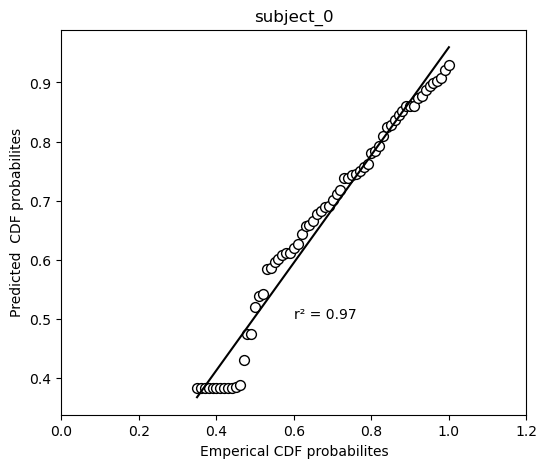

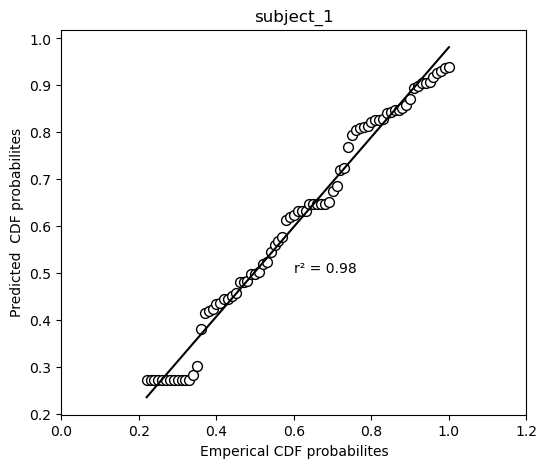

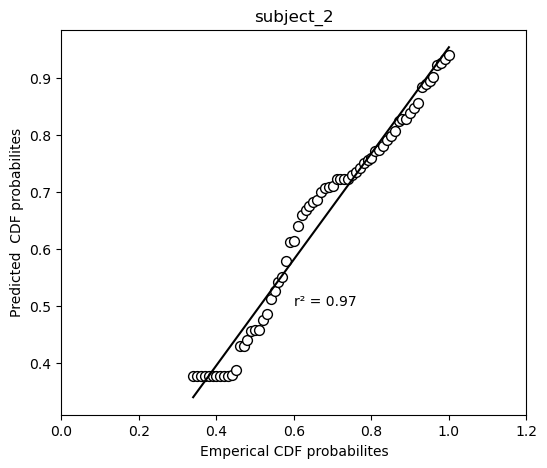

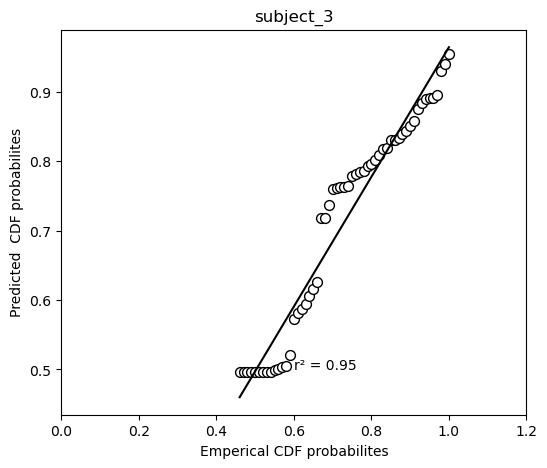

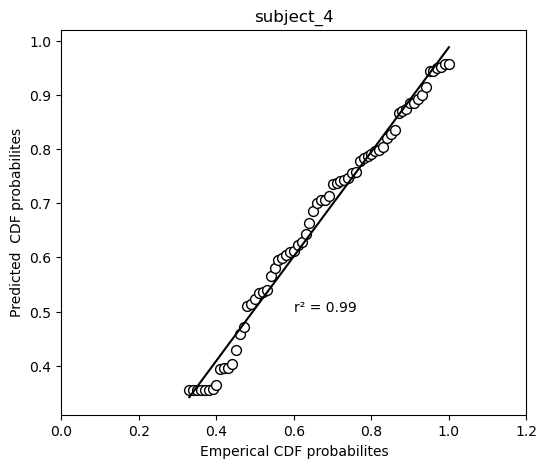

...

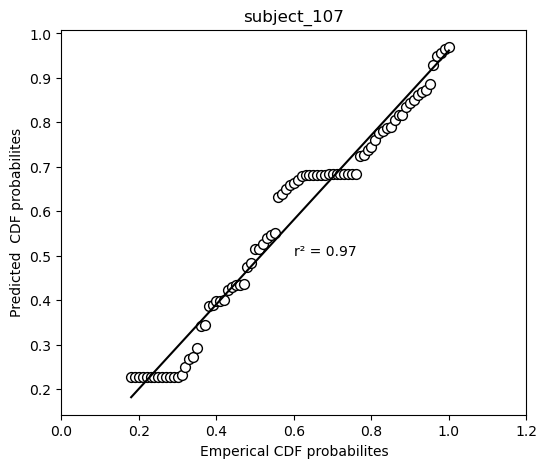

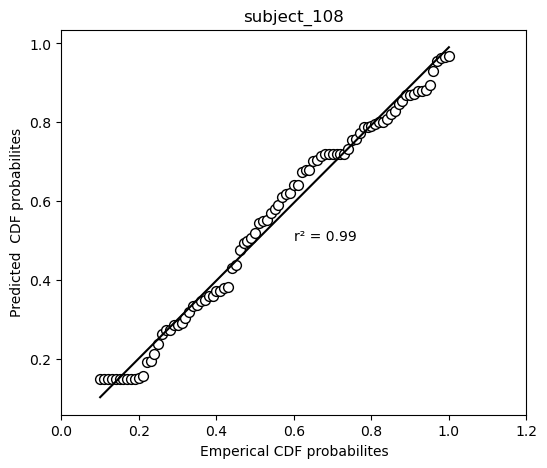

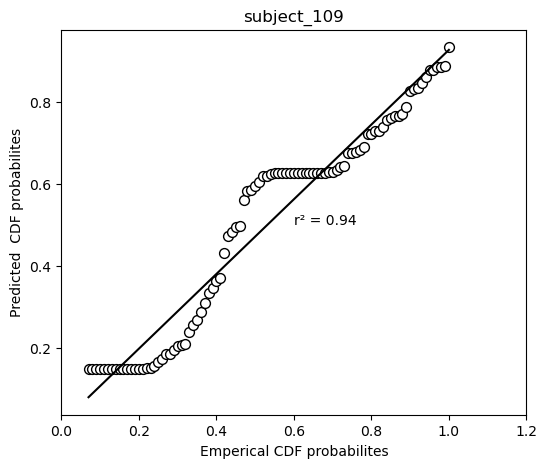

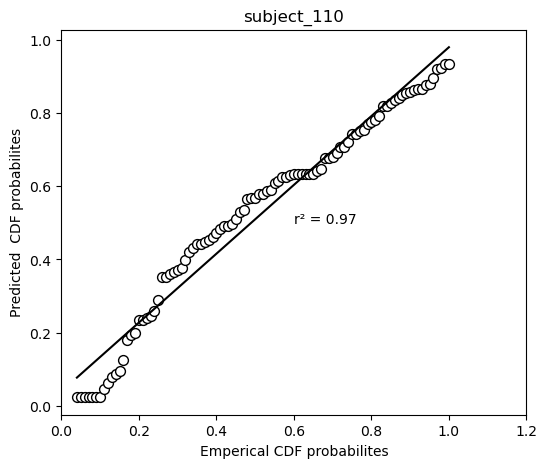

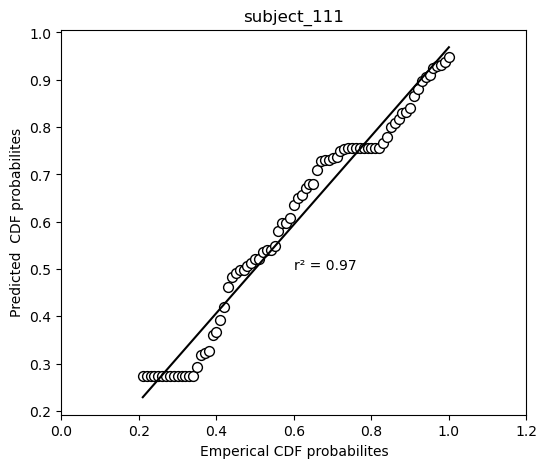

In [9]:
r_list = []
slope_list = []
p_value_list = []
intercept_list = []
for i in range(len(new_cdf_list)):   
    elem = new_cdf_list[i]
# for elem in new_cdf_list:   
    fig = plt.figure(figsize=(6, 5))

    Y_test = elem [:,1] 
    Y_pred = elem [:,2]
    m, b, r_value, p_value, std_err = scipy.stats.linregress(elem [:,1], elem [:,2])
    r_squared =r_value**2
    r_list.append(r_squared)
    slope_list.append(m)
    p_value_list.append(p_value)
    intercept_list.append(b)
    plt.scatter(Y_test,Y_pred, marker='o',color='w',s= 50,edgecolors='black')
    plt.xlabel('Emperical CDF probabilites')
    plt.ylabel('Predicted  CDF probabilites')
    plt.title(f'subject_{i}')        
    plt.plot(np.unique(Y_test), np.poly1d(np.polyfit(Y_test, Y_pred, 1))(np.unique(Y_test)),'k')
    plt.xlim(0,1.2)
    plt.text(00.6, 0.5, 'r² = %0.2f' % r_squared)

In [12]:
lr_stat_iid_diff = np.array(r_list[0:28]).mean(),np.array(slope_list[0:28]).mean(),np.array(p_value_list[0:28]).mean(),np.array(intercept_list[0:28]).mean()
lr_stat_iid_diff

(0.964697206664038,
 0.9325520653893637,
 1.7426154421175904e-32,
 0.029748052110381694)

In [14]:
len(r_list)

112

In [17]:
import scipy.stats as st
import numpy as np

CI_iid_diff = []
CI_iid_diff.append(st.t.interval(confidence=0.95, df=len(r_list[0:28])-1, loc=np.mean(r_list[0:28]), scale=st.sem(r_list[0:28])))
CI_iid_diff.append(st.t.interval(confidence=0.95, df=len(slope_list[0:28])-1, loc=np.mean(slope_list[0:28]), scale=st.sem(slope_list[0:28])))
CI_iid_diff.append(st.t.interval(confidence=0.95, df=len(p_value_list[0:28])-1, loc=np.mean(p_value_list[0:28]), scale=st.sem(p_value_list[0:28])))
CI_iid_diff.append(st.t.interval(confidence=0.95, df=len(intercept_list[0:28])-1, loc=np.mean(intercept_list[0:28]), scale=st.sem(intercept_list[0:28])))

CI_iid_diff


[(0.9576095615737485, 0.9717848517543275),
 (0.9142519151348638, 0.9508522156438637),
 (-9.843411345224527e-33, 4.4695720187576334e-32),
 (0.01735100585166334, 0.04214509836910005)]

In [18]:
from scipy import stats
p_val_slope_iid_diff = stats.ttest_1samp(slope_list[0:28], 1).pvalue
p_val_inter_iid_diff = stats.ttest_1samp(intercept_list[0:28], 0).pvalue
p_val_slope_iid_diff,p_val_inter_iid_diff


(3.907198149365423e-08, 3.739867698115847e-05)

In [22]:
28+28+28

84

In [20]:
p_val_slope_iid_same = stats.ttest_1samp(slope_list[28:56], 1).pvalue
p_val_inter_iid_same = stats.ttest_1samp(intercept_list[28:56], 0).pvalue
p_val_slope_iid_same,p_val_inter_iid_same

(3.988944263701148e-08, 0.00030575060133611093)

In [23]:
p_val_slope_rdw_diff = stats.ttest_1samp(slope_list[56:84], 1).pvalue
p_val_inter_rdw_diff = stats.ttest_1samp(intercept_list[56:84], 0).pvalue
p_val_slope_rdw_diff,p_val_inter_rdw_diff

(1.343050417650598e-11, 0.00031264840138281734)

In [24]:
p_val_slope_rdw_same = stats.ttest_1samp(slope_list[84:], 1).pvalue
p_val_inter_rdw_same = stats.ttest_1samp(intercept_list[84:], 0).pvalue
p_val_slope_rdw_same,p_val_inter_rdw_same

(2.216504039270487e-07, 0.034623038759842975)

In [21]:
lr_stat_iid_same = np.array(r_list[28:56]).mean(),np.array(slope_list[28:56]).mean(),np.array(p_value_list[28:56]).mean(),np.array(intercept_list[28:56]).mean()
lr_stat_iid_same

(0.9672030377393143,
 0.9451726990372623,
 5.55523752608866e-34,
 0.021276496120471687)

In [26]:
CI_iid_same = []
CI_iid_same.append(st.t.interval(confidence=0.95, df=len(r_list[28:56])-1, loc=np.mean(r_list[28:56]), scale=st.sem(r_list[28:56])))
CI_iid_same.append(st.t.interval(confidence=0.95, df=len(slope_list[28:56])-1, loc=np.mean(slope_list[28:56]), scale=st.sem(slope_list[28:56])))
CI_iid_same.append(st.t.interval(confidence=0.95, df=len(p_value_list[28:56])-1, loc=np.mean(p_value_list[28:56]), scale=st.sem(p_value_list[28:56])))
CI_iid_same.append(st.t.interval(confidence=0.95, df=len(intercept_list[28:56])-1, loc=np.mean(intercept_list[28:56]), scale=st.sem(intercept_list[28:56])))

CI_iid_same

[(0.9597327718550914, 0.9746733036235371),
 (0.9302802648461224, 0.9600651332284023),
 (-5.83545180348776e-34, 1.694592685566508e-33),
 (0.010730190056286974, 0.0318228021846564)]

In [27]:
lr_stat_rdw_diff = np.array(r_list[56:84]).mean(),np.array(slope_list[56:84]).mean(),np.array(p_value_list[56:84]).mean(),np.array(intercept_list[56:84]).mean()
lr_stat_rdw_diff

(0.9724742366399676,
 0.9484733308373297,
 5.606187660884787e-41,
 0.01413689930921099)

In [28]:
CI_rdw_diff = []
CI_rdw_diff.append(st.t.interval(confidence=0.95, df=len(r_list[56:84])-1, loc=np.mean(r_list[56:84]), scale=st.sem(r_list[56:84])))
CI_rdw_diff.append(st.t.interval(confidence=0.95, df=len(slope_list[56:84])-1, loc=np.mean(slope_list[56:84]), scale=st.sem(slope_list[56:84])))
CI_rdw_diff.append(st.t.interval(confidence=0.95, df=len(p_value_list[56:84])-1, loc=np.mean(p_value_list[56:84]), scale=st.sem(p_value_list[56:84])))
CI_rdw_diff.append(st.t.interval(confidence=0.95, df=len(intercept_list[56:84])-1, loc=np.mean(intercept_list[56:84]), scale=st.sem(intercept_list[56:84])))

CI_rdw_diff 

[(0.9660633198539746, 0.9788851534259605),
 (0.938979955125743, 0.9579667065489164),
 (-5.896758638083026e-41, 1.71091339598526e-40),
 (0.007115304470293566, 0.021158494148128412)]

In [29]:
lr_stat_rdw_same = np.array(r_list[84:]).mean(),np.array(slope_list[84:]).mean(),np.array(p_value_list[84:]).mean(),np.array(intercept_list[84:]).mean()
lr_stat_rdw_same

(0.968921660124246,
 0.9541042924626757,
 1.6276252531060884e-51,
 0.009769449037140355)

In [31]:
CI_rdw_same = []
CI_rdw_same.append(st.t.interval(confidence=0.95, df=len(r_list[84:])-1, loc=np.mean(r_list[84:]), scale=st.sem(r_list[84:])))
CI_rdw_same.append(st.t.interval(confidence=0.95, df=len(slope_list[84:])-1, loc=np.mean(slope_list[84:]), scale=st.sem(slope_list[84:])))
CI_rdw_same.append(st.t.interval(confidence=0.95, df=len(p_value_list[84:])-1, loc=np.mean(p_value_list[84:]), scale=st.sem(p_value_list[84:])))
CI_rdw_same.append(st.t.interval(confidence=0.95, df=len(intercept_list[84:])-1, loc=np.mean(intercept_list[84:]), scale=st.sem(intercept_list[84:])))

CI_rdw_same

[(0.9617663805960082, 0.9760769396524838),
 (0.9403964800942249, 0.9678121048311265),
 (-1.703234437344501e-51, 4.9584849435566774e-51),
 (0.0007606669262564397, 0.01877823114802427)]